## Loading Data

In [1]:
from statsmodels.regression.rolling import RollingOLS
import pandas_datareader.data as web
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import pandas_ta
import warnings
warnings.filterwarnings('ignore')

!pip install pandas-ta
import pandas_ta as ta
import math

In [2]:
# Define a list with the given ticker symbols
klci_stocks = [
    '5681.KL', '3182.KL', '1066.KL', '5285.KL', '5296.KL', '1295.KL',
    '1082.KL', '5183.KL', '7084.KL', '1155.KL', '5819.KL', '1015.KL',
    '4863.KL', '5225.KL', '4715.KL', '5347.KL', '1961.KL', '1023.KL',
    '6888.KL', '4707.KL', '4065.KL', '6947.KL', '6012.KL', '2445.KL',
    '3816.KL', '4197.KL', '4677.KL', '6033.KL', '6742.KL', '8869.KL'
]

# Display the list
print(klci_stocks)

['5681.KL', '3182.KL', '1066.KL', '5285.KL', '5296.KL', '1295.KL', '1082.KL', '5183.KL', '7084.KL', '1155.KL', '5819.KL', '1015.KL', '4863.KL', '5225.KL', '4715.KL', '5347.KL', '1961.KL', '1023.KL', '6888.KL', '4707.KL', '4065.KL', '6947.KL', '6012.KL', '2445.KL', '3816.KL', '4197.KL', '4677.KL', '6033.KL', '6742.KL', '8869.KL']


In [3]:
#Extract data of stocks listed in KLCI index from yfinance from January 2022 to March 2024

end_date = '2024-03-31'

start_date = '2022-01-01'

df = yf.download(tickers=klci_stocks,
                 start=start_date,
                 end=end_date).stack()

#set date and ticker as index
df.index.names = ['date', 'ticker']

df.columns = df.columns.str.lower()

df

[*********************100%%**********************]  30 of 30 completed


Price               adj close  close       high    low   open   volume
date       ticker                                                     
2022-01-03 1015.KL   2.848593   3.20   3.200000   3.16   3.17   251700
           1023.KL   4.897364   5.49   5.500000   5.40   5.40  2735700
           1066.KL   4.487801   5.40   5.420000   5.36   5.37   898300
           1082.KL  16.278488  17.34  17.559999  17.32  17.34    49100
           1155.KL   7.058859   8.33   8.340000   8.26   8.29  1600100
...                       ...    ...        ...    ...    ...      ...
2024-03-29 6742.KL   3.847055   3.87   3.910000   3.72   3.78  8607300
           6888.KL   2.690000   2.69   2.720000   2.66   2.70  5720000
           6947.KL   4.151204   4.19   4.240000   4.16   4.21  4645600
           7084.KL   5.900000   5.90   5.930000   5.87   5.90  1660300
           8869.KL   4.636437   4.65   4.700000   4.61   4.65  4053300

[16410 rows x 6 columns]

In [4]:
#Check details and if any missing values
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 16410 entries, (Timestamp('2022-01-03 00:00:00'), '1015.KL') to (Timestamp('2024-03-29 00:00:00'), '8869.KL')
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   adj close  16410 non-null  float64
 1   close      16410 non-null  float64
 2   high       16410 non-null  float64
 3   low        16410 non-null  float64
 4   open       16410 non-null  float64
 5   volume     16410 non-null  int64  
dtypes: float64(5), int64(1)
memory usage: 839.1+ KB


Price
adj close    0
close        0
high         0
low          0
open         0
volume       0
dtype: int64

## Calculate Technical Indicator

- Garman-Klass Volatility
- RSI
- Bollinger Bands
- ATR
- MACD
- Dollar Volume

In [5]:
df['garman_klass_vol'] = np.sqrt((np.log(df['high'])-np.log(df['low']))**2)/2-(2*np.log(2)-1)*((np.log(df['adj close'])-np.log(df['open']))**2)

df['rsi'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.rsi(close=x, length=20))

df['bb_low'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,0])
                                                          
df['bb_mid'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,1])
                                                          
df['bb_high'] = df.groupby(level=1)['adj close'].transform(lambda x: pandas_ta.bbands(close=np.log1p(x), length=20).iloc[:,2])

def compute_atr(stock_data):
    atr = pandas_ta.atr(high=stock_data['high'],
                        low=stock_data['low'],
                        close=stock_data['close'],
                        length=14)
    return atr

df['atr'] = df.groupby(level=1, group_keys=False).apply(compute_atr)


def compute_macd(close):
    macd = ta.macd(close=close, length=20).iloc[:,0]
    return macd.sub(macd.mean()).div(macd.std())

df['macd'] = df.groupby(level=1, group_keys=False)['adj close'].apply(compute_macd)

df['dollar_volume'] = (df['adj close']*df['volume'])/1e6

df

Price               adj close  close       high    low   open   volume  \
date       ticker                                                        
2022-01-03 1015.KL   2.848593   3.20   3.200000   3.16   3.17   251700   
           1023.KL   4.897364   5.49   5.500000   5.40   5.40  2735700   
           1066.KL   4.487801   5.40   5.420000   5.36   5.37   898300   
           1082.KL  16.278488  17.34  17.559999  17.32  17.34    49100   
           1155.KL   7.058859   8.33   8.340000   8.26   8.29  1600100   
...                       ...    ...        ...    ...    ...      ...   
2024-03-29 6742.KL   3.847055   3.87   3.910000   3.72   3.78  8607300   
           6888.KL   2.690000   2.69   2.720000   2.66   2.70  5720000   
           6947.KL   4.151204   4.19   4.240000   4.16   4.21  4645600   
           7084.KL   5.900000   5.90   5.930000   5.87   5.90  1660300   
           8869.KL   4.636437   4.65   4.700000   4.61   4.65  4053300   

Price               garman_klass_vol        rsi    bb_low    bb_mid   bb_high  \
date       ticker                                                               
2022-01-03 1015.KL          0.001874        NaN       NaN       NaN       NaN   
           1023.KL          0.005487        NaN       NaN       NaN       NaN   
           1066.KL         -0.006876        NaN       NaN       NaN       NaN   
           1082.KL          0.005339        NaN       NaN       NaN       NaN   
           1155.KL         -0.005165        NaN       NaN       NaN       NaN   
...                              ...        ...       ...       ...       ...   
2024-03-29 6742.KL          0.024787  54.050061  1.519660  1.565212  1.610764   
           6888.KL          0.011148  49.077906  1.284648  1.316465  1.348281   
           6947.KL          0.009448  46.809822  1.628256  1.654464  1.680672   
           7084.KL          0.005085  53.468877  1.923734  1.933761  1.943788   
           8869.KL          0.009664  49.461722  1.702622  1.724245  1.745869   

Price                    atr      macd  dollar_volume  
date       ticker                                      
2022-01-03 1015.KL       NaN       NaN       0.716991  
           1023.KL       NaN       NaN      13.397718  
           1066.KL       NaN       NaN       4.031391  
           1082.KL       NaN       NaN       0.799274  
           1155.KL       NaN       NaN      11.294881  
...                      ...       ...            ...  
2024-03-29 6742.KL  0.151766 -0.521378      33.112758  
           6888.KL  0.070276  0.576776      15.386800  
           6947.KL  0.096162 -0.102635      19.284832  
           7084.KL  0.072030 -0.139360       9.795770  
           8869.KL  0.076368  0.137462      18.792872  

[16410 rows x 14 columns]

## Exploratory Data Analysis on Daily Stock Data

In [6]:
#make a copy
EDA_data=df.copy()

In [7]:
# Function to calculate daily returns
def calculate_daily_returns(df):
    df['Daily Return'] = df.groupby('ticker')['adj close'].pct_change()
    return df

# Calculate daily returns
EDA_data = calculate_daily_returns(EDA_data)

In [23]:
# Summary statistics for each stock
for col in EDA_data.columns:
    summary_stats = EDA_data.groupby('ticker')[[col]].agg(['mean', 'std', 'min', 'max'])
    print(f'\nSummary Statistics of {summary_stats}')

     # saving the excel
    with pd.ExcelWriter('/Users/sunyee/Library/CloudStorage/OneDrive-UniversitiSainsMalaysia/Y4S2/FYP/Output/EDA_SummaryStatistics/SummaryStatistics.xlsx', engine='openpyxl', mode='a') as writer:
        summary_stats.to_excel(writer, sheet_name=f'\n{summary_stats}')

    print('DataFrame is written to Excel File successfully.')


Summary Statistics of Price     adj close                                  
               mean       std         min         max
ticker                                               
1015.KL    3.529431  0.297276    2.830790    4.242096
1023.KL    5.194904  0.504560    4.237245    6.650000
1066.KL    5.081509  0.195894    4.487801    5.431748
1082.KL   17.467731  0.701186   15.923293   19.090431
1155.KL    8.114270  0.551886    6.974119    9.750000
1295.KL    4.049560  0.189362    3.613923    4.405360
1961.KL    3.848588  0.166139    3.476841    4.458395
2445.KL   21.511019  1.601640   18.580351   27.377949
3182.KL    4.339208  0.245123    3.910757    5.006707
3816.KL    6.758353  0.300672    5.946552    7.637860
4065.KL   15.558052  0.747518   13.629572   17.226547
4197.KL    2.131108  0.176871    1.880028    2.700000
4677.KL    0.966885  0.631953    0.466220    2.750000
4707.KL  127.038658  4.637654  112.713737  135.792297
4715.KL    2.537956  0.121003    2.303752    2.828432
4863.

## Rank top 10 Stocks According to Mean of Different Technical Indicators

In [9]:
# Sort stocks based on average daily return in descending order
summary_stats = EDA_data.groupby('ticker')[['Daily Return']].agg(['mean', 'std', 'min', 'max'])

sorted_return = summary_stats.loc[:,'Daily Return'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest average daily return
top10_stocks_return = sorted_return.head(10)

top10_stocks_return

,mean,std,min,max
ticker,,,,
6742.KL,0.003825,0.023505,-0.084615,0.148148
4677.KL,0.003194,0.024384,-0.088083,0.148837
1015.KL,0.000719,0.012925,-0.052632,0.061225
5347.KL,0.000651,0.010862,-0.040280,0.058195
1023.KL,0.000621,0.011221,-0.073555,0.065336
1155.KL,0.000600,0.006326,-0.025901,0.026528
5285.KL,0.000558,0.019933,-0.100939,0.106132
7084.KL,0.000538,0.011765,-0.051383,0.059701
4197.KL,0.000528,0.012904,-0.043478,0.085470


In [10]:
# Sort stocks based on average RSI in descending order
summary_stats = EDA_data.groupby('ticker')[['rsi']].agg(['mean', 'std', 'min', 'max'])

sorted_rsi = summary_stats.loc[:,'rsi'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest average RSI
top10_stocks_rsi = sorted_rsi.head(10)

top10_stocks_rsi

,mean,std,min,max
ticker,,,,
6742.KL,59.352007,10.651528,34.434222,86.701945
4677.KL,56.736786,10.973181,24.963965,87.487088
1155.KL,56.001641,8.413672,35.299458,84.079465
1023.KL,54.208840,9.505278,31.199569,73.278049
1015.KL,53.649541,8.220503,29.802366,71.138185
5347.KL,53.467800,9.777905,22.988004,77.921798
3816.KL,53.402053,6.891169,30.695363,76.100070
4863.KL,52.847992,9.301358,28.667261,79.980149
1066.KL,52.682389,7.484165,32.541190,70.646987


In [11]:
# Sort stocks based on average Garman-Klass Volatility(GKV) in descending order
summary_stats = EDA_data.groupby('ticker')[['garman_klass_vol']].agg(['mean', 'std', 'min', 'max'])

sorted_vol = summary_stats.loc[:,'garman_klass_vol'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest average GKV
top10_stocks_vol = sorted_vol.head(10)

top10_stocks_vol

,mean,std,min,max
ticker,,,,
6742.KL,0.014766,0.010496,-0.000131,0.105378
4677.KL,0.014672,0.009816,-0.002466,0.060054
5296.KL,0.013284,0.006502,-0.000057,0.058935
5285.KL,0.012017,0.007593,0.001653,0.057849
8869.KL,0.011969,0.006403,0.002025,0.039680
6888.KL,0.011545,0.006392,-0.001791,0.060655
5681.KL,0.010183,0.005982,-0.000512,0.043991
6947.KL,0.010129,0.005307,-0.002025,0.040760
5183.KL,0.009816,0.005484,0.000318,0.044545


In [12]:
# Sort stocks based on average Moving Average Convergence Divergence(MACD) in descending order
summary_stats = EDA_data.groupby('ticker')[['macd']].agg(['mean', 'std', 'min', 'max'])

sorted_macd = summary_stats.loc[:,'macd'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest average MACD
top10_stocks_macd = sorted_macd.head(10)

top10_stocks_macd

,mean,std,min,max
ticker,,,,
4677.KL,1.291660e-16,1.0,-1.613585,3.590614
1023.KL,9.914248e-17,1.0,-2.984494,1.967566
6033.KL,5.270319e-17,1.0,-2.519557,2.169354
4863.KL,4.967924e-17,1.0,-2.407435,2.050090
7084.KL,3.574745e-17,1.0,-2.946788,2.499993
6012.KL,3.326349e-17,1.0,-2.248928,2.542109
5183.KL,3.034079e-17,1.0,-3.206852,2.133907
1015.KL,2.872756e-17,1.0,-2.579209,1.690753
1155.KL,2.851156e-17,1.0,-2.390382,3.145762


In [13]:
# Sort stocks based on average Average True Range(ATR) in descending order
summary_stats = EDA_data.groupby('ticker')[['atr']].agg(['mean', 'std', 'min', 'max'])

sorted_atr = summary_stats.loc[:,'atr'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest ATR
top10_stocks_atr = sorted_atr.head(10)

top10_stocks_atr

,mean,std,min,max
ticker,,,,
4707.KL,1.441056,0.382945,0.675259,2.642897
5681.KL,0.513957,0.134359,0.269089,0.815245
2445.KL,0.470466,0.170029,0.182482,0.957344
4065.KL,0.302705,0.076099,0.168127,0.481939
1082.KL,0.275914,0.076475,0.124646,0.514857
5819.KL,0.269672,0.056360,0.174624,0.455269
6033.KL,0.254426,0.050279,0.149970,0.388254
5183.KL,0.179993,0.046717,0.105694,0.309276
5347.KL,0.130531,0.032441,0.071740,0.220815


In [14]:
# Sort stocks based on average dollar volume in descending order
summary_stats = EDA_data.groupby('ticker')[['dollar_volume']].agg(['mean', 'std', 'min', 'max'])

sorted_dollarvol = summary_stats.loc[:,'dollar_volume'].sort_values(by="mean",ascending=False)

# Select the top 10 stocks with the highest average dollar_volume
top10_stocks_dollarvol = sorted_dollarvol.head(10)

top10_stocks_dollarvol

,mean,std,min,max
ticker,,,,
1023.KL,74.095103,54.019750,9.971665,588.780122
1295.KL,70.689449,46.390003,8.851126,496.721175
1155.KL,70.573719,44.044044,0.000000,484.468062
5183.KL,47.731218,38.452008,3.423094,235.647866
5347.KL,37.255780,32.562447,5.802724,385.819579
8869.KL,33.187936,30.455268,3.252762,282.871250
6742.KL,32.041313,68.452103,0.077853,996.663220
2445.KL,26.292888,30.328737,0.000000,267.290730
4677.KL,26.259318,57.604383,0.000000,1025.215682


In [15]:
# Sort stocks based on average Bollinger bandwidth in descending order
EDA_data['bb_bandwidth']=(EDA_data['bb_high']-EDA_data['bb_low'])/EDA_data['bb_mid']
summary_stats = EDA_data.groupby('ticker')[['bb_bandwidth']].agg(['mean', 'std', 'min', 'max'])

sorted_bandwidth = summary_stats.loc[:,'bb_bandwidth'].sort_values(by='mean',ascending=False)

# Select the top 10 stocks with the highest average Bollinger bandwidth
top10_stocks_bandwidth = sorted_bandwidth.head(10)

top10_stocks_bandwidth

,mean,std,min,max
ticker,,,,
6742.KL,0.109763,0.069181,0.019582,0.355810
4677.KL,0.107860,0.070641,0.022227,0.385341
5296.KL,0.059174,0.024529,0.021362,0.132716
6888.KL,0.058580,0.026343,0.017002,0.144877
8869.KL,0.052529,0.037027,0.010873,0.188794
5285.KL,0.048696,0.038726,0.013396,0.259808
6012.KL,0.044422,0.022680,0.010444,0.124158
6947.KL,0.042134,0.022409,0.009024,0.129053
4715.KL,0.040849,0.015908,0.008708,0.082157


## Visualization with Candlestick Chart

In [16]:
import plotly.graph_objects as go

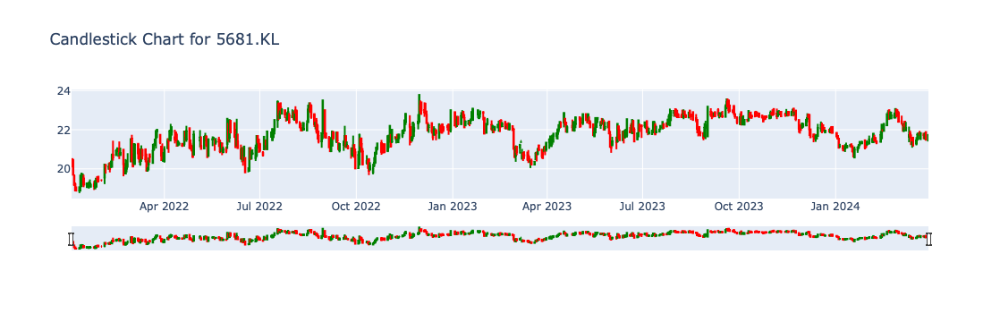

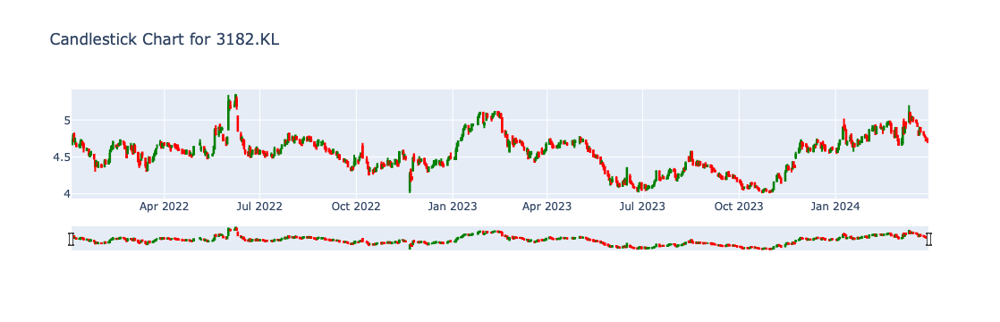

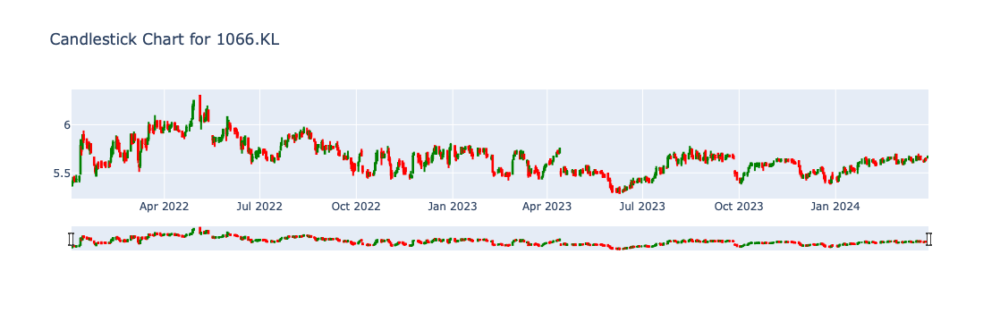

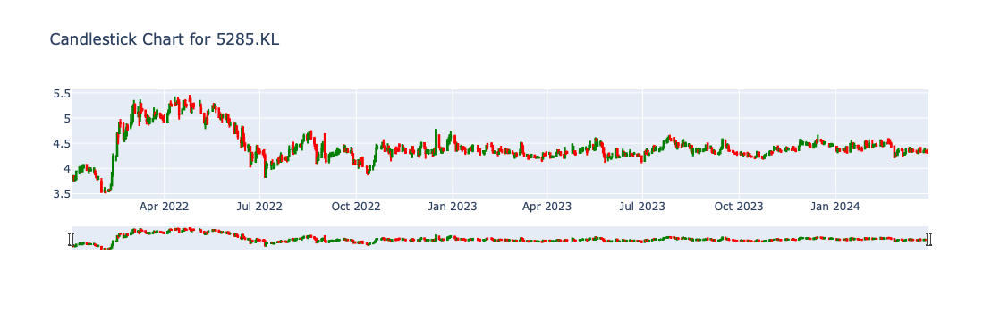

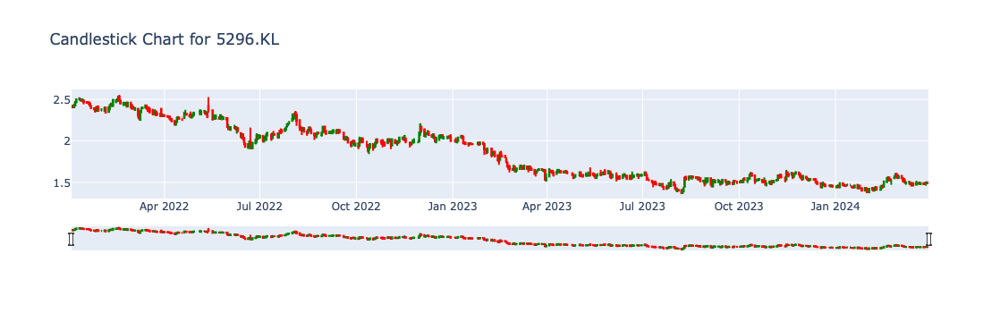

...

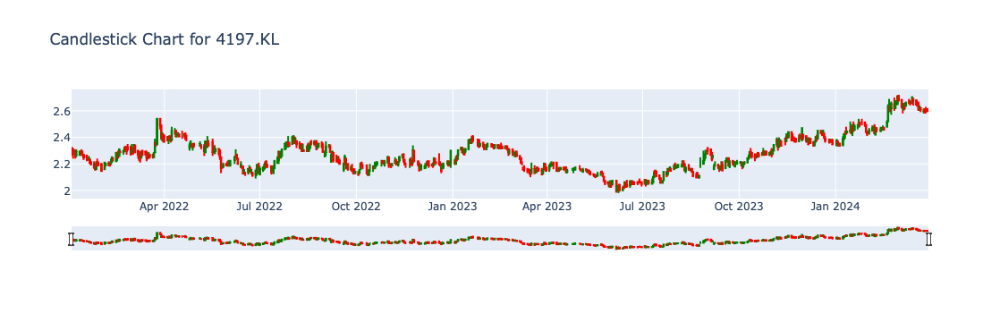

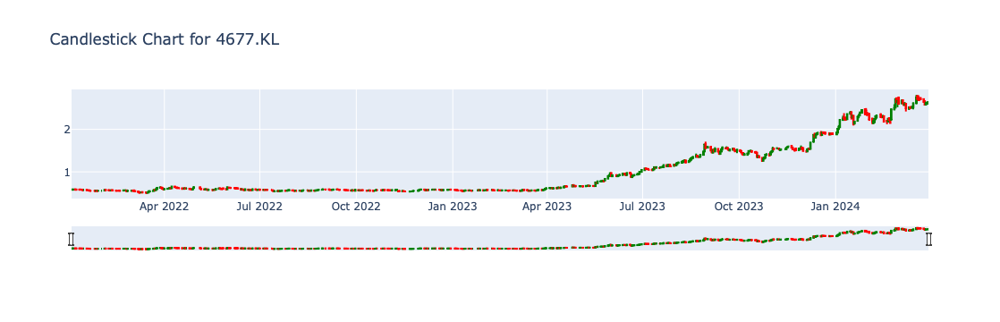

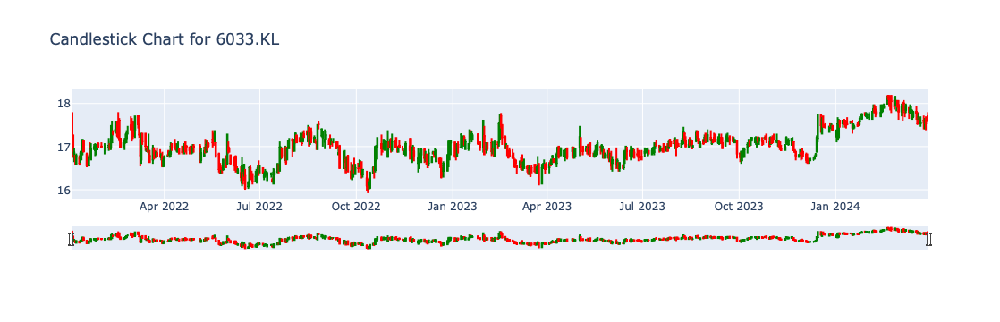

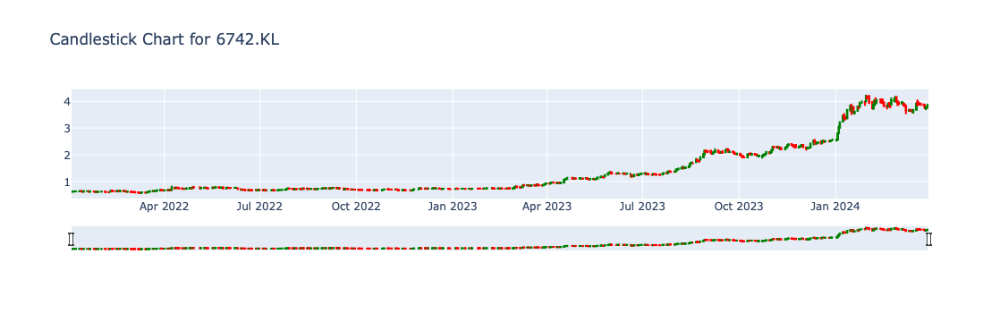

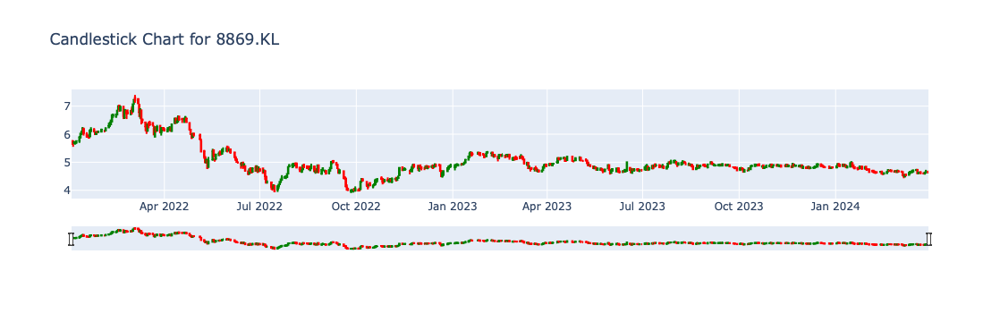

In [17]:
for ticker in klci_stocks:
    candle_data = EDA_data.loc[EDA_data.index.get_level_values('ticker') == ticker].reset_index()
    fig = go.Figure(data=[go.Candlestick(x=candle_data['date'],
                                         open=candle_data['open'],
                                         high=candle_data['high'],
                                         low=candle_data['low'],
                                         close=candle_data['close'],
                                         increasing_line_color='green',
                                         decreasing_line_color='red')])
    fig.update_layout(title=f'Candlestick Chart for {ticker}',
                      yaxis_autorange=True,  # Automatically adjust y-axis range
                      yaxis_fixedrange=False)  # Allow interactive zooming
    fig.show()
                        